## *Text Classification Using Unsupervised Learning Techniques*

This code complements my diploma thesis on "Text Classification Using Unsupervised Learning Techniques" for the Electrical and Computer Engineering Department of Aristotle University of Thessaloniki, Greece.

Author: **Kitsios Konstantinos**

Correspondance address: kitsiosk@ece.auth.gr

Code sub-routines and pretrained neural networks are used from the research papers below:

[1]: D. Cer, Y. Yang, S. yi Kong, N. Hua, N. Limtiaco, R. S. John, N. Constant,M. Guajardo-Cespedes, S. Yuan, C. Tar, Y.-H. Sung, B. Strope, and R. Kurzweil, ‘‘Universal sentence encoder,’’arXiv preprint arXiv:1803.11175, 2018.

[2]: A. Radford, J. Wu, R. Child, D. Luan, D. Amodei, and I. Sutskever, ‘‘Language models areunsupervised multitask learners,’’, 2019.

[3]: N. Pitsianis, A. Iliopoulos, D. Floros, and X. Sun, ‘‘Spaceland embedding of sparse stochastic graphs,’’2019 IEEE High Performance Extreme Computing Conference (HPEC),pp. 1-8, 2019.



## Load Universal Sentence Encoder [1]

In [ ]:
!pip3 install --quiet "tensorflow>=1.7"
!pip3 install --quiet tensorflow-hub
!pip3 install --quiet seaborn

In [ ]:
# Load the Universal Sentence Encoder's TF Hub module
from absl import logging

import tensorflow as tf

import tensorflow_hub as hub
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import re
import seaborn as sns

module_url = "https://tfhub.dev/google/universal-sentence-encoder-large/5" #@param ["https://tfhub.dev/google/universal-sentence-encoder/4", "https://tfhub.dev/google/universal-sentence-encoder-large/5"]
modelEval2 = hub.load(module_url)
print ("module %s loaded" % module_url)
def embed(input):
  return modelEval2(input)

module https://tfhub.dev/google/universal-sentence-encoder-large/5 loaded


## Define Helper Functions

In [ ]:
import torch
cos = torch.nn.CosineSimilarity(dim=0, eps=1e-6) # Cosine Similarity function

In [ ]:
# Embed a sentence batch into R^N using USE
def getEmbedding(sntcBatch):
    return torch.tensor(np.asarray(embed(sntcBatch)))

In [ ]:
# Similar to the above, for whole documents instead of sentences.
# The embedding of the document is calculated as the average of all its sentences
def getDocumentEmbedding(documentBatch):
  docEmbeddings = torch.zeros(len(documentBatch), 512)
  for (i, doc) in enumerate(documentBatch):
    sentences = tokenize.sent_tokenize(doc)
    sentEmbeddings = getEmbedding(sentences)
    avgEmbedding = torch.mean(sentEmbeddings, axis=0)
    docEmbeddings[i, :] = avgEmbedding
  return docEmbeddings

In [ ]:
# Return the cosine similarity between 2 vectors (or other similarity function)
def getSimilarity(a, b):
  return cos(a, b)

In [ ]:
# Compute similarity matrix between 2 embedding arrays 
def evaluateEmbeddingsMultiple(generatedEmbeddingsArr, evaluationEmbeddingsArr):
  nSentences = len(generatedEmbeddingsArr)
  nKeywords  = len(evaluationEmbeddingsArr)
  scores = torch.zeros(size=(nSentences, 1))

  for i in range(nSentences):
    if i % 10000 == 0:
      print(i)
    for j in range(nKeywords):
      scores[i] += getSimilarity(evaluationEmbeddingsArr[j], generatedEmbeddingsArr[i]) 
    scores[i] = scores[i]/nKeywords

  score = torch.mean(scores)
  std = torch.std(scores)

  return score, std, scores

## GPT-2 for Text Generation [2]

In [ ]:
# Install GPT2 [2]
from transformers import GPT2Tokenizer, GPT2LMHeadModel
tokenizer = GPT2Tokenizer.from_pretrained('gpt2-medium')
model = GPT2LMHeadModel.from_pretrained('gpt2-medium')
device = 'cuda' # change to 'cpu' if no GPU is available
model = model.to(device)

In [ ]:
# Top-k sampling
def choose_from_top(probs, n=40):
    ind = np.argpartition(probs, -n)[-n:]
    top_prob = probs[ind]
    top_prob = top_prob / np.sum(top_prob) # Normalize
    choice = np.random.choice(n, 1, p = top_prob)
    token_id = ind[choice][0]
    return int(token_id)

In [ ]:
  def generate(model=model, prompt='<|endoftext|>', nSentences=20, showOnlyFinished=0, n=40):
  #   """
  #   Function GENERATE()
  #   INPUTS:
  #     model           : Pytorch Model     - Pytorch Language Model to use
  #     prompt          : String            - User prompt 
  #     nSentences      : Int               - Number of sentences to generate
  #     showOnlyFinished: Boolean           - Wether to display only generated sentences that end with <|endoftext|>
  #     n               : Int               - top-n sampler parameter. Set higher for more diversity, but too high will produce nonsense

  #   AUTHOR: Kitsios Konstantinos
  #   """

      # Turn model in evaluation mode(deactivate dropouts etc)
      model.eval()
      # Number of sentences generated so far
      gen_num = 0
      # Array to return
      generatedSentenceArr = []
      # Tokenizer(Suppose GPT2 model)
      tokenizer = GPT2Tokenizer.from_pretrained('gpt2-medium')

      with torch.no_grad():

              # How many sentences to generate
              for gen_idx in range(nSentences):
                  # Generation not finished yet
                  gen_finished = False

                  # Define custom prompt
                  cur_ids = torch.tensor(tokenizer.encode(prompt)).unsqueeze(0).to(device)

                  # Predict the next 50 words(unless EOS token encountered)
                  for i in range(10):
                      # Forward pass the model to get outputs
                      outputs = model(cur_ids, labels=cur_ids)
                      # Get logits
                      loss, logits = outputs[:2]
                      # Transform logits to probabilities
                      softmax_logits = torch.softmax(logits[0, -1], dim=0) #Take the first(from only one in this case) batch and the last predicted embedding
                      # Sample using top-n sampler
                      next_token_id = choose_from_top(softmax_logits.to('cpu').numpy(), n=n) #Randomly(from the topN probability distribution) select the next word
                      cur_ids = torch.cat([cur_ids, torch.ones((1,1)).long().to(device) * next_token_id], dim = 1) # Add the last word to the running sequence

                      if next_token_id in tokenizer.encode('<|endoftext|>'):
                          gen_finished = True
                          break

                  
                  if gen_finished or not showOnlyFinished:
                      
                      gen_num = gen_num + 1
                      
                      output_list = list(cur_ids.squeeze().to('cpu').numpy())
                      output_text = tokenizer.decode(output_list)
                      generatedSentenceArr.append(output_text.replace('<|endoftext|>', ''))
      return generatedSentenceArr

## Preparation

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from nltk import tokenize
import nltk
nltk.download('punkt')

In [ ]:
# Load the data
df = pd.read_csv('train.csv')

In [ ]:
# Match classes {1, 2, 3, 4} with their associated labels
topics = ['World', 'Sports', 'Business', 'Science']
df['Topic'] = 'None'
df.loc[df['Class Index']==1, 'Topic'] = 'World'
df.loc[df['Class Index']==2, 'Topic'] = 'Sports'
df.loc[df['Class Index']==3, 'Topic'] = 'Business'
df.loc[df['Class Index']==4, 'Topic'] = 'Science'

In [ ]:
# Use 200 first characters of description
df['ShortDescription'] = df['Description'].str.slice(start=0, stop=200)

In [ ]:
len(df)

120000

In [ ]:
# # Optional: Downsample for faster results
# sampleSize = 1000
# dfMin = pd.concat([df.loc[ df['Topic'] == 'World'].sample(sampleSize), df[ df['Topic']=='Sports'].sample(sampleSize), df[ df['Topic']=='Business'].sample(sampleSize), df[ df['Topic']=='Science'].sample(sampleSize)])

In [ ]:
# Do not downsample
dfMin = df

In [ ]:
dfMin.head()

,Class Index,Title,Description,Topic,ShortDescription
0,3,Wall St. Bears Claw Back Into the Black (Reuters),"Reuters - Short-sellers, Wall Street's dwindli...",Business,"Reuters - Short-sellers, Wall Street's dwindli..."
1,3,Carlyle Looks Toward Commercial Aerospace (Reu...,Reuters - Private investment firm Carlyle Grou...,Business,Reuters - Private investment firm Carlyle Grou...
2,3,Oil and Economy Cloud Stocks' Outlook (Reuters),Reuters - Soaring crude prices plus worries\ab...,Business,Reuters - Soaring crude prices plus worries\ab...
3,3,Iraq Halts Oil Exports from Main Southern Pipe...,Reuters - Authorities have halted oil export\f...,Business,Reuters - Authorities have halted oil export\f...
4,3,"Oil prices soar to all-time record, posing new...","AFP - Tearaway world oil prices, toppling reco...",Business,"AFP - Tearaway world oil prices, toppling reco..."


In [ ]:
len(dfMin)

120000

In [ ]:
# Concatenate the 2 fields
combined = list(dfMin[['Title', 'ShortDescription']].apply(lambda x: '. '.join(x), axis=1))

In [ ]:
# Compute embeddings of all documents
textEmbeddings = getDocumentEmbedding(combined)

In [ ]:
# # Save embeddings for later use
# torch.save(textEmbeddings, 'AGNewsEmbeddings.pt')

In [ ]:
# # Load saved embeddings (if exist)
# textEmbeddings = torch.load('AGNewsEmbeddings.pt')

In [ ]:
textEmbeddings.shape

torch.Size([120000, 512])

Text(0, 0.5, 'Frequency')

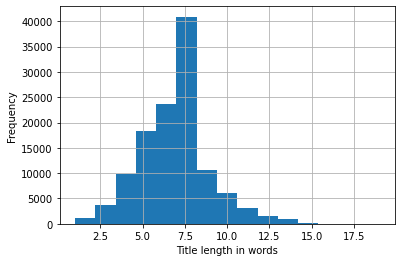

In [ ]:
ax = dfMin['Title'].str.split().str.len().hist(bins=15)
ax.set_xlabel('Title length in words')
ax.set_ylabel('Frequency')

Text(0, 0.5, 'Frequency')

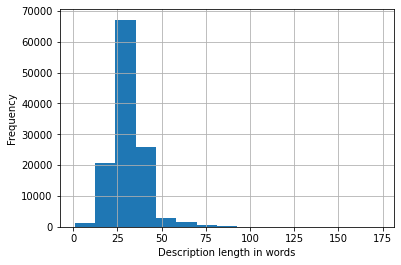

In [ ]:
ax = dfMin['Description'].str.split().str.len().hist(bins=15)
ax.set_xlabel('Description length in words')
ax.set_ylabel('Frequency')

## Visualization

For visualization in 2-dimensional space we use the SG-t-SNE algorithm from [3] that currently runs in Julia language, so we computed the 2D Embeddings there and we load it from a .mat file here

In [ ]:
!pip install hdf5storage

     |████████████████████████████████| 61kB 6.8MB/s 


In [ ]:
import hdf5storage
mat = hdf5storage.loadmat('AGNewsData_sgtsnepi.mat')

In [ ]:
embeddings2D = mat['Y']

In [ ]:
embeddings2D.shape

(120000, 2)

In [ ]:
# Prepare the DataFrame to visualize
dfBokeh = pd.DataFrame(data={
    'x': embeddings2D[:, 0],
    'y': embeddings2D[:, 1],
    'text': list(df['Title']),
    'label': list(df['Class Index']),
    'labelText': list(df['Topic'])
})

In [ ]:
dfBokeh['color'] = 'black'
dfBokeh.loc[dfBokeh['label']==1   , 'color'] = 'lightcoral'
dfBokeh.loc[dfBokeh['label']==2   , 'color'] = 'khaki'
dfBokeh.loc[dfBokeh['label']==3   , 'color'] = 'lightskyblue'
dfBokeh.loc[dfBokeh['label']==4   , 'color'] = 'olive'

dfBokeh['size'] = 2

In [ ]:
# Bokeh Libraries
from bokeh.io import output_notebook, output_file, save
from bokeh.plotting import figure, show
from bokeh.models import HoverTool, OpenURL, TapTool
from bokeh.models import ColumnDataSource, CustomJS
from bokeh.models import TextInput, Button, Div, Slider, Paragraph
from bokeh.layouts import column, row
from bokeh import events
from bokeh.core.properties import value
from bokeh.events import MouseWheel
from bokeh.models.glyphs import Text, Circle, Glyph, ImageURL
from bokeh.util.browser import view
from bokeh.transform import linear_cmap
from bokeh.palettes import Spectral6, Turbo256



# Output thevisualization directly in the notebook
output_notebook()
output_file(basePath + 'AGNewsDataset/AGNews.html')

In [ ]:
fig = figure(plot_height=550, plot_width=700,
          match_aspect=True, title='2D embeddings of AGNews Dataset documents')
# fig.title.text_font_style = 'bold'
# fig.title.align = 'center'

fig.xgrid.visible=False
fig.ygrid.visible=False

cds = ColumnDataSource(dfBokeh)
circleRenderer = fig.circle(x='x', y='y', legend='labelText', size='size', source=cds, color='color')

# Format the tooltip
tooltips = """
<div style="width:400px;">
@text
</div>
"""
# Add the HoverTool to the figure
hover = HoverTool(tooltips=tooltips, renderers=[circleRenderer])
fig.add_tools(hover)
show(fig)
save(fig)

'/content/gdrive/My Drive/AGNewsDataset/AGNews.html'

## Artificial Label Mining

#### GPT-2

In [ ]:
# Generate new sentences from each label (topic)
relatedEmbeddings = []
relatedSentencesArr = []
nRelatedSentences = 100
for (iTopic, topic) in enumerate(topics):
  print(topic)

  relatedSentences = []
  if topic == 'Science':
    relatedSentences.append('Technology')
  else:
    relatedSentences.append(topic)


  # # Enrichent method
  # if topic == 'Science':
  #   relatedSentences = generate(model, prompt='In summary, technology', n=40, nSentences=int(nRelatedSentences/2))
  #   relatedSentences = relatedSentences +  generate(model, prompt='In summary, science', n=40, nSentences=int(nRelatedSentences/2))
  #   # relatedSentences = relatedSentences + generate(model, prompt='Science', n=40, nSentences= int(nRelatedSentences/2))
  #   # relatedSentences = relatedSentences + generate(model, prompt='Technology', n=40, nSentences = int(nRelatedSentences/2))
  # elif topic == 'World':
  #   relatedSentences = generate(model, prompt='In summary, ' + topic.lower(), n=40, nSentences=nRelatedSentences)
  #   # relatedSentences = generate(model, prompt=topic, n=40, nSentences=nRelatedSentences)
  # else:
  #   relatedSentences = generate(model, prompt='In summary, ' + topic.lower(), n=40, nSentences = nRelatedSentences)
  #   #relatedSentences = relatedSentences + generate(model, prompt=topic, n=40, nSentences = int(nRelatedSentences/2))


  print(len(relatedSentences))
  relatedSentencesArr.append(relatedSentences)

  relatedEmbeddings.append(getEmbedding(relatedSentences))

  # # Optional: Save artifical labels and their embeddings for later use
  # np.save(topic+'_USE_100', relatedEmbeddings[iTopic])
  # with open(topic+'_USE_100_Raw.txt', 'w') as f:
  #   f.write( '\n'.join(relatedSentences) )

World
1
Sports
1
Business
1
Science
1


### Use saved

In [ ]:
# # Optional: Use saved artificial labels and embeddings (if exist)
relatedEmbeddings = []
relatedSentencesArr = []

for (iTopic, topic) in enumerate(topics):
  relatedEmbeddings.append(np.load(topic+'_USE_100.npy'))

  with open(topic+'_USE_100_Raw.txt', 'r') as f:
    relatedSentencesArr.append(f.readlines())

## Prepare Inputs for Classification

In [ ]:
allEmbeddings = textEmbeddings

for (iTopic, topic) in enumerate(topics):
  print(topic)
  allEmbeddings = np.concatenate([allEmbeddings, relatedEmbeddings[iTopic]])

pca = PCA(n_components=200)
embeddingsPCA = pca.fit_transform(allEmbeddings)

# plt.plot(np.cumsum(pca.explained_variance_ratio_))
# plt.xlabel('number of components')
# plt.ylabel('cumulative explained variance');

embeddingsPCA = allEmbeddings
nSentences = len(dfMin)
nTopics = len(topics)
nRelatedSentences = len(relatedEmbeddings[0])

relatedEmbeddingsPCA = []
for (iTopic, topic) in enumerate(topics):
  relatedEmbeddingsPCA.append( torch.tensor(embeddingsPCA[nSentences + iTopic*nRelatedSentences : nSentences+(iTopic+1)*nRelatedSentences]) )

embeddingsArr = torch.tensor(embeddingsPCA[0:nSentences])

World
Sports
Business
Science


### Maximum Similarity Classification

In [ ]:
probabilitiesDescription = torch.zeros(size=(len(embeddingsArr), nTopics))

for (iTopic, topic) in enumerate(topics):
  print(topic)
  evaluationEmbeddings = relatedEmbeddingsPCA[iTopic]

  meanScore, std, proba = evaluateEmbeddingsMultiple(embeddingsArr, evaluationEmbeddings)
  probabilitiesDescription[:, iTopic] = proba.T

ypredDescription = torch.argmax(probabilitiesDescription, dim=1) + 1

y = dfMin['Class Index']

World
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
Sports
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
Business
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000
Science
0
10000
20000
30000
40000
50000
60000
70000
80000
90000
100000
110000


In [ ]:
print(accuracy_score(y, ypredDescription))

0.58875


In [ ]:
print(precision_score(y, ypredDescription, average=None))
print('Precision: {:0.3f}'.format(np.mean(precision_score(y, ypredDescription, average='weighted'))))

print(recall_score(y, ypredDescription, average=None))
print('Recall: {:0.3f}'.format(np.mean(recall_score(y, ypredDescription, average='weighted'))))

print(f1_score(y, ypredDescription, average=None))
print('F1: {:0.3f}'.format(np.mean(f1_score(y, ypredDescription, average='weighted'))))

[0.5163374  0.69609856 0.55198653 0.54892776]
Precision: 0.578
[0.36503333 0.8475     0.56823333 0.57423333]
Recall: 0.589
[0.42769826 0.7643743  0.55999212 0.56129547]
F1: 0.578


In [ ]:
cm = confusion_matrix(y, ypredDescription)

Text(123.0, 0.5, 'Actual')

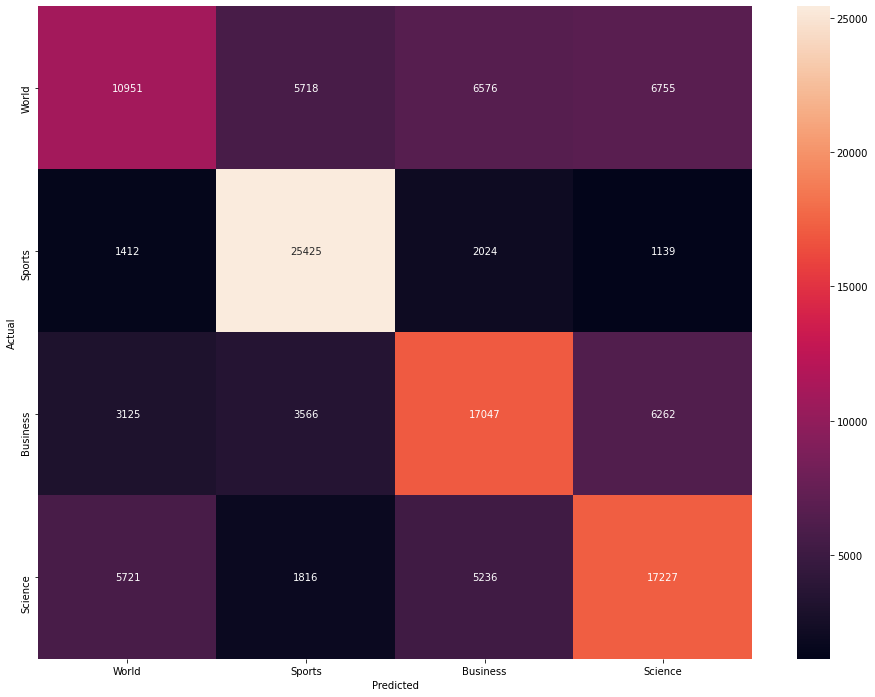

In [ ]:
plt.figure(figsize=(16, 12))
sns.heatmap(cm, annot=True, fmt='d', xticklabels=topics, yticklabels=topics)
plt.xlabel('Predicted')
plt.ylabel('Actual')

### kNN with cosine similarity
kNN libraries don't support cosine similarity as it is not a valid metric in the mathematical sense, so we implemented it ourselves

In [ ]:
# Construct distances matrix
X = torch.zeros(size=(nSentences, len(topics) * nRelatedSentences))

start = 0
for (iTopic, topic) in enumerate(topics):
  print(topic)

  relatedEmbeddingsArr = relatedEmbeddingsPCA[iTopic]

  for iSentence in range(nSentences):
    nextFree = start
    for iKeyword in range(nRelatedSentences):
      X[iSentence][nextFree] = getSimilarity(embeddingsArr[iSentence], relatedEmbeddingsArr[iKeyword])
      nextFree += 1

  start += nRelatedSentences

World
Sports
Business
Science


In [ ]:
ypred = np.zeros((nSentences, ))
y = np.asarray(dfMin['Class Index'])

acc  = []
prec = []
rec  = []
f1   = []
rng = range(1, 200, 10)
for k in rng:
  for i in range(nSentences):
    idx = np.argpartition(X[i, :], -k)[-k:]

    tmpIdx = idx.clone().detach()

    
    tmpIdx[idx>=3*nRelatedSentences] = 4
    idx[idx>=3*nRelatedSentences] = -1

    tmpIdx[idx>=2*nRelatedSentences] = 3
    idx[idx>=2*nRelatedSentences] = -1

    tmpIdx[idx>=1*nRelatedSentences] = 2
    idx[idx>=1*nRelatedSentences] = -1

    tmpIdx[idx>=0*nRelatedSentences] = 1
    idx[idx>=0*nRelatedSentences] = -1

    ypred[i] = torch.mode(tmpIdx).values.item()

  acc.append(accuracy_score(y, ypred))
  prec.append(precision_score(y, ypred, average='weighted'))
  rec.append(recall_score(y, ypred, average='weighted'))
  f1.append(f1_score(y, ypred, average='weighted'))


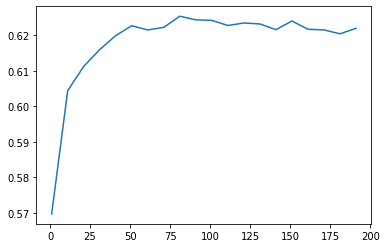

In [ ]:
plt.plot(rng, f1)

In [ ]:
idx = np.argmax(acc)
k = rng[idx]

print(k)
print('Precision: {:0.3f}'.format(prec[idx]))
print('Recall: {:0.3f}'.format(rec[idx]))
print('F1: {:0.3f}'.format(f1[idx]))


81
Precision: 0.678
Recall: 0.651
F1: 0.625


### kNN with distance metrics

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
nRelatedSentencesArr = [nRelatedSentences]*nTopics
X = np.zeros((sum(nRelatedSentencesArr), 512))
ytrain = np.zeros((sum(nRelatedSentencesArr), 1))
for (iTopic, topic) in enumerate(topics):
  X[sum(nRelatedSentencesArr[0:iTopic]) : sum(nRelatedSentencesArr[0:iTopic+1]), :] = relatedEmbeddingsPCA[iTopic]
  ytrain[sum(nRelatedSentencesArr[0:iTopic]) : sum(nRelatedSentencesArr[0:iTopic+1])] = iTopic + 1

In [ ]:
acc = []
rng = range(2, 100, 5)
for k in rng:
  knn = KNeighborsClassifier(n_neighbors=k, p=2, weights='distance')
  knn.fit(X, ytrain)
  ypred = knn.predict(embeddingsArr)
  acc.append(accuracy_score(y, ypred))

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  """
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:5: DataConversionWarning: A column-

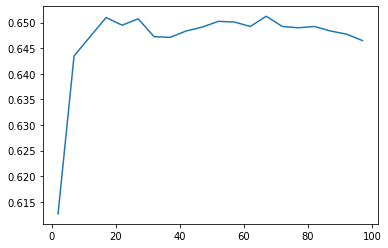

In [ ]:
plt.plot(rng, acc)